# Step 0: Loading the data and installing the libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install scanpy==1.9.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.1/122.1 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 10.2 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=c1d5ae62c3250d814b04642510dd283c7884d9dd0a740b64e74136f1d54bd803
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8027 sha256=2ae71b2ec3c37ea94b4d292f8813ce0a2c681b72f5d71d76e2555cc92c70d7ea
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9b

In [ ]:
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 17.8 MB/s eta 0:00:00


In [ ]:
!pip install decoupler

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 1.8 MB/s eta 0:00:00


In [ ]:
!pip install omnipath

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docrep: filename=docrep-0.3.2-py3-none-any.whl size=19878 sha256=ed2bffa3c755a5b437d1abf2645a06bc3cb8eec0cb97aaf63230de971bcb3ba1
  Stored in directory: /root/.cache/pip/wheels/c3/64/48/03c38d8d906159eaa210b3c548fdb590eb3e2a4a5745ae2172
Successfully built docrep


In [ ]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
# !cd "/content/drive/MyDrive/Dataset"; tar -xzf Visium_FFPE_Human_Breast_Cancer_spatial.tar.gz

Reading visium data

In [ ]:
adata = sc.read_visium('/content/drive/MyDrive/Dataset')

adata.var_names_make_unique()

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


The obs are "spots", not "cells". So kinda low-res bulk RNA

In [ ]:
adata #2518 spots X 17943 genes

AnnData object with n_obs × n_vars = 2518 × 17943
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Image data (coordinates) are stored under the following adata slot:

In [ ]:
adata.uns['spatial']['Visium_FFPE_Human_Breast_Cancer']['images']

{'hires': array([[[1.        , 1.        , 1.        ],
         [0.99607843, 0.99607843, 0.99607843],
         [0.99215686, 0.99607843, 0.99215686],
         ...,
         [0.9843137 , 0.99607843, 0.99215686],
         [0.9882353 , 0.99607843, 0.99215686],
         [0.99607843, 0.99607843, 0.99607843]],
 
        [[1.        , 1.        , 1.        ],
         [0.99607843, 0.99607843, 0.99607843],
         [0.99215686, 0.99607843, 0.99215686],
         ...,
         [0.9843137 , 0.99215686, 0.9882353 ],
         [0.9882353 , 0.99215686, 0.99215686],
         [0.99607843, 0.99607843, 0.99607843]],
 
        [[1.        , 1.        , 1.        ],
         [0.99607843, 0.99607843, 0.99607843],
         [0.99215686, 0.99607843, 0.99215686],
         ...,
         [0.9843137 , 0.99215686, 0.9882353 ],
         [0.9843137 , 0.99215686, 0.9882353 ],
         [0.99215686, 0.99607843, 0.99607843]],
 
        ...,
 
        [[0.99607843, 0.99607843, 0.99607843],
         [0.99607843, 0.99607843

In [ ]:
adata.obs

,in_tissue,array_row,array_col
AAACAAGTATCTCCCA-1,1,50,102
AAACACCAATAACTGC-1,1,59,19
AAACAGAGCGACTCCT-1,1,14,94
AAACAGCTTTCAGAAG-1,1,43,9
AAACAGGGTCTATATT-1,1,47,13
...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64
TTGTTGTGTGTCAAGA-1,1,31,77
TTGTTTCACATCCAGG-1,1,58,42
TTGTTTCATTAGTCTA-1,1,60,30


Adding a dummy "constant" col to adata.obs so that we can see the spots on spatial map

In [ ]:
adata.obs['dummy_col'] = 'a'

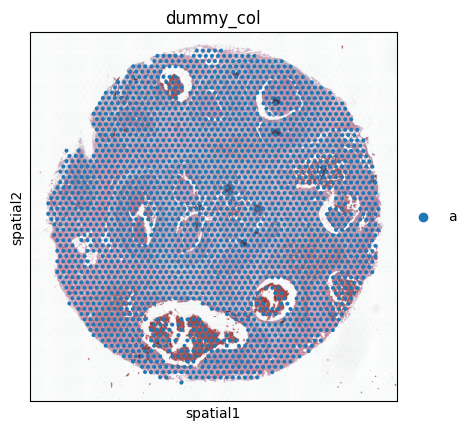

In [ ]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, color = 'dummy_col')

#Step 1: QC Filtering

In [ ]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [ ]:
adata.obs

,in_tissue,array_row,array_col,dummy_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
AAACAAGTATCTCCCA-1,1,50,102,a,6327,8.752740,21201.0,9.961851,16.871846,22.428187,29.234470,41.842366,0.0,0.0,0.0
AAACACCAATAACTGC-1,1,59,19,a,3184,8.066208,5672.0,8.643474,17.736248,23.113540,30.483075,44.340621,0.0,0.0,0.0
AAACAGAGCGACTCCT-1,1,14,94,a,4741,8.464214,13042.0,9.476007,32.403006,36.313449,41.558043,52.162245,0.0,0.0,0.0
AAACAGCTTTCAGAAG-1,1,43,9,a,2913,7.977282,5527.0,8.617581,23.394246,29.093541,36.240275,49.502443,0.0,0.0,0.0
AAACAGGGTCTATATT-1,1,47,13,a,2572,7.852828,4591.0,8.432071,25.070791,30.298410,37.638859,51.600958,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,a,4077,8.313362,8648.0,9.065199,20.848751,25.716929,32.550879,44.981499,0.0,0.0,0.0
TTGTTGTGTGTCAAGA-1,1,31,77,a,5635,8.636930,13509.0,9.511186,16.129987,20.534459,26.441632,38.300392,0.0,0.0,0.0
TTGTTTCACATCCAGG-1,1,58,42,a,1912,7.556428,2994.0,8.004700,22.745491,28.490314,36.272545,52.839011,0.0,0.0,0.0
TTGTTTCATTAGTCTA-1,1,60,30,a,3892,8.266935,8074.0,8.996528,19.618529,25.068120,32.140203,45.392618,0.0,0.0,0.0


<ipython-input-16-18138c9bfa86>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
<ipython-input-16-18138c9bfa86>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])


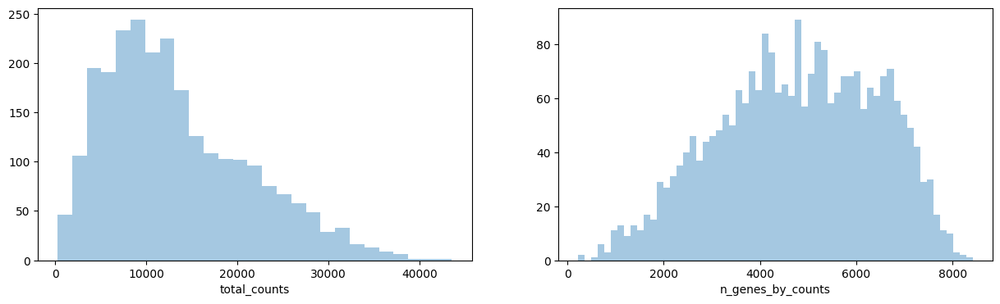

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])

plt.show()

In [ ]:
adata.obs['total_counts'] = adata.X.sum(axis=1)

percentile_98 = np.percentile(adata.obs['total_counts'], 98)
percentile_2 = np.percentile(adata.obs['total_counts'], 2)

print(f"The 98th percentile of total counts is: {percentile_98}")
print(f"The 2nd percentile of total counts is: {percentile_2}")

The 98th percentile of total counts is: 31979.659999999993
The 2nd percentile of total counts is: 1993.38


In [ ]:
sc.pp.filter_cells(adata, min_counts = percentile_2)

In [ ]:
sc.pp.filter_cells(adata, max_counts=percentile_98)

<ipython-input-20-18138c9bfa86>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
<ipython-input-20-18138c9bfa86>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])


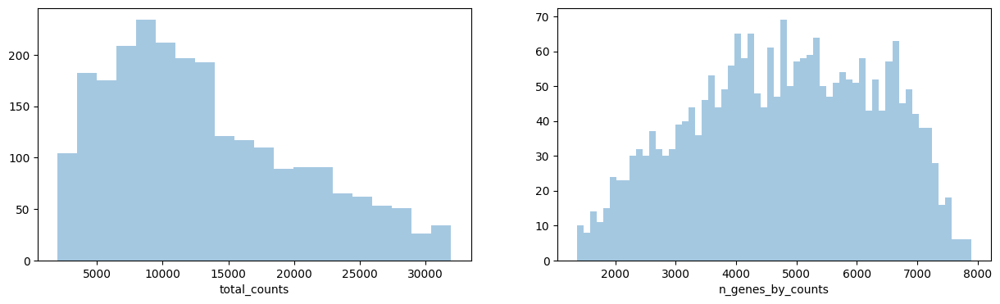

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])

plt.show()

In [ ]:
n_genes_by_cell = np.sum(adata.X > 0, axis=1)

# Assign the calculated n_genes to the AnnData observations (cells)
adata.obs['n_genes'] = n_genes_by_cell

# Now calculate the 98th and 2nd percentiles for n_genes
percentile_98_n_genes = np.percentile(adata.obs['n_genes'], 98)
percentile_2_n_genes = np.percentile(adata.obs['n_genes'], 2)

print(f"The 98th percentile of n_genes is: {percentile_98_n_genes}")
print(f"The 2nd percentile of n_genes is: {percentile_2_n_genes}")

The 98th percentile of n_genes is: 7354.4
The 2nd percentile of n_genes is: 1849.0


In [ ]:
sc.pp.filter_cells(adata, min_genes = percentile_2_n_genes)

In [ ]:
sc.pp.filter_cells(adata, max_genes = percentile_98_n_genes)

<ipython-input-24-18138c9bfa86>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
<ipython-input-24-18138c9bfa86>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])


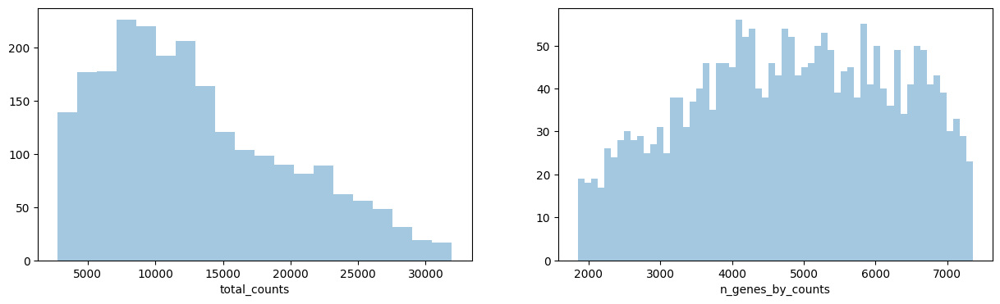

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])

plt.show()

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


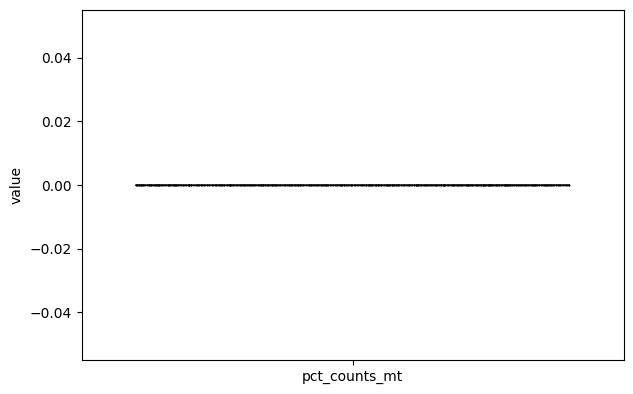

In [ ]:
sc.pl.violin(adata, ['pct_counts_mt'], jitter=0.4)

In [ ]:
sc.pp.filter_genes(adata, min_cells=3)

In [ ]:
adata

AnnData object with n_obs × n_vars = 2318 × 16672
    obs: 'in_tissue', 'array_row', 'array_col', 'dummy_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'dummy_col_colors'
    obsm: 'spatial'

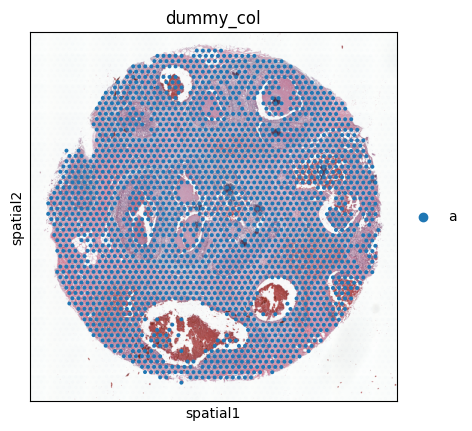

In [ ]:
sc.pl.spatial(adata, color = 'dummy_col')

#Step 2: Normalize and scale data

In [ ]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

#Step 3 and 4: PCA & Leiden

In [ ]:
adata.raw = adata

In [ ]:
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [ ]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)

In [ ]:
adata

AnnData object with n_obs × n_vars = 2318 × 16672
    obs: 'in_tissue', 'array_row', 'array_col', 'dummy_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'dummy_col_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


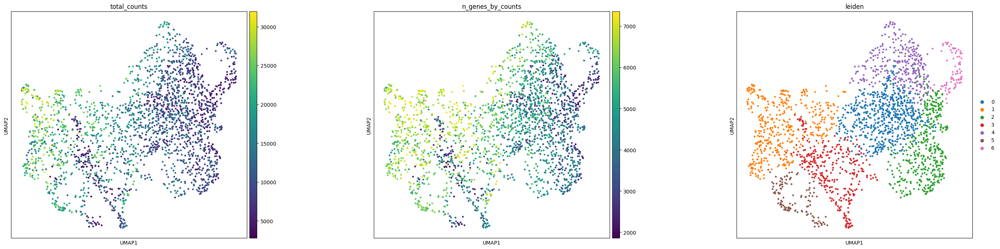

In [ ]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts","leiden"], wspace=0.4)

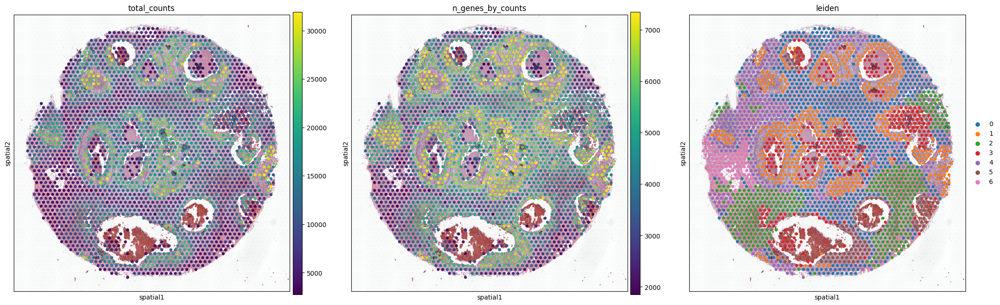

In [ ]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts", "leiden"])

#Step 5: Finding Markers for Clusters and Cell-type annotation

## Manual Annotation

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

In [ ]:
#convert to dataframe
results = adata.uns['rank_genes_groups']
('0', '1', '2', '3', '4')

out = np.array([[0,0,0,0,0]])
for group in results['names'].dtype.names:
    out = np.vstack((out, np.vstack((results['names'][group],
                                     results['scores'][group],
                                     results['pvals_adj'][group],
                                     results['logfoldchanges'][group],
                                     np.array([group] * len(results['names'][group])).astype('object'))).T))



markers = pd.DataFrame(out[1:], columns = ['Gene', 'scores', 'pval_adj', 'lfc', 'cluster'])

markers = markers[(markers.pval_adj < 0.05) & (abs(markers.lfc) > 1)]

In [ ]:
markers

,Gene,scores,pval_adj,lfc,cluster
0,AEBP1,21.732389,0.0,1.514522,0
1,CCN2,20.906864,0.0,1.428344,0
2,SFRP4,20.101196,0.0,1.72928,0
3,SFRP2,20.093746,0.0,1.469333,0
4,CXCL14,19.795189,0.0,1.74175,0
...,...,...,...,...,...
116699,AZGP1,-11.100204,0.0,-1.935027,6
116700,SPINT2,-11.196445,0.0,-2.399995,6
116701,ERBB2,-11.421288,0.0,-2.523322,6
116702,XBP1,-11.455423,0.0,-1.486808,6


### Annotating Cell Type for Cluster 0

In [ ]:
markers[markers.cluster == '0']

,Gene,scores,pval_adj,lfc,cluster
0,AEBP1,21.732389,0.0,1.514522,0
1,CCN2,20.906864,0.0,1.428344,0
2,SFRP4,20.101196,0.0,1.72928,0
3,SFRP2,20.093746,0.0,1.469333,0
4,CXCL14,19.795189,0.0,1.74175,0
...,...,...,...,...,...
16471,APOC2,-5.272581,0.000004,-1.275777,0
16505,ADGRF1,-5.527629,0.000001,-1.024545,0
16618,AQP9,-7.021473,0.0,-1.800967,0
16631,ANGPTL4,-7.293883,0.0,-1.069606,0


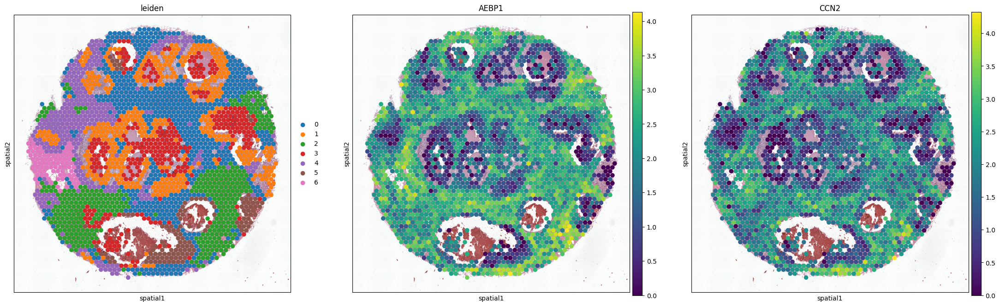

In [ ]:
sc.pl.spatial(adata, img_key="hires", color=["leiden", "AEBP1", "CCN2"], size=1.5)

## DecoupleR for  cell type annotation

In [ ]:
# Cell-type annotation using DecoupleR

import decoupler as dc

In [ ]:
# Query Omnipath and get PanglaoDB
markers = dc.get_resource('PanglaoDB')
markers

0.00B [00:00, ?B/s]

0.00B [00:00, ?B/s]

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,CTRB1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,KLK1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,KLK1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [ ]:
markers = markers[markers['human'] & markers['canonical_marker']]
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
5,KLK1,True,Principal cells,Mesoderm,True,0.000000,0.008145,True,0.285714,0.014058,9606,Kidney,0.013
6,KLK1,True,Acinar cells,Endoderm,True,0.833333,0.005031,True,0.314286,0.012826,9606,Pancreas,0.013
7,KLK1,True,Plasmacytoid dendritic cells,Mesoderm,True,0.000000,0.008202,True,1.000000,0.012914,9606,Immune system,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [ ]:
dc.run_ora(
    mat=adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 2318 samples and 16672 targets for 147 sources.


100%|██████████| 2318/2318 [00:12<00:00, 187.60it/s]


In [ ]:
adata.obsm["ora_estimate"]

source,Acinar cells,Endothelial cells,Principal cells,Plasmacytoid dendritic cells,Paneth cells,Epsilon cells,Fibroblasts,Ductal cells,Macrophages,Luminal epithelial cells,...,Luteal cells,Follicular cells,Taste receptor cells,Neuroendocrine cells,GABAergic neurons,Osteocytes,Merkel cells,Granulosa cells,Trophoblast progenitor cells,Trichocytes
AAACAAGTATCTCCCA-1,0.861578,0.332016,-0.000000,0.489842,0.141690,0.299790,4.320867,6.448059,0.406486,13.558333,...,0.920958,-0.000000,-0.000000,-0.0,-0.000000,0.920958,1.288509,-0.000000,-0.000000,-0.0
AAACACCAATAACTGC-1,0.428465,5.279730,-0.000000,7.281368,0.892899,0.087080,12.975172,0.311603,6.207817,1.489417,...,-0.000000,-0.000000,-0.000000,-0.0,-0.000000,0.920958,-0.000000,-0.000000,-0.000000,-0.0
AAACAGAGCGACTCCT-1,0.428465,1.763840,-0.000000,5.467467,-0.000000,1.075316,15.633051,5.496900,0.406486,4.240984,...,-0.000000,-0.000000,-0.000000,-0.0,0.459782,0.920958,1.288509,-0.000000,-0.000000,-0.0
AAACAGCTTTCAGAAG-1,2.065867,4.253485,-0.000000,2.450819,0.892899,0.087080,17.500282,1.107231,5.565907,3.455692,...,-0.000000,-0.000000,-0.000000,-0.0,-0.000000,0.920958,-0.000000,0.805029,-0.000000,-0.0
AAACAGGGTCTATATT-1,0.134749,0.677480,-0.000000,3.120091,0.141690,0.633892,13.841551,0.655190,3.282996,2.073966,...,-0.000000,-0.000000,-0.000000,-0.0,0.459782,0.920958,0.496919,-0.000000,-0.000000,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,0.861578,1.157248,0.287868,1.846029,0.892899,0.299790,15.633051,3.764080,8.287595,5.978859,...,-0.000000,-0.000000,-0.000000,-0.0,-0.000000,0.920958,0.496919,-0.000000,-0.000000,-0.0
TTGTTGTGTGTCAAGA-1,0.428465,4.253485,-0.000000,1.846029,0.892899,0.299790,13.841551,2.990104,1.908165,0.574756,...,-0.000000,-0.000000,-0.000000,-0.0,-0.000000,0.920958,0.496919,-0.000000,-0.000000,-0.0
TTGTTTCACATCCAGG-1,0.861578,2.487946,0.287868,0.060043,0.892899,0.087080,12.128954,1.654005,5.565907,2.073966,...,-0.000000,-0.000000,0.255712,-0.0,-0.000000,2.295322,-0.000000,-0.000000,-0.000000,-0.0
TTGTTTCATTAGTCTA-1,0.861578,7.588376,-0.000000,0.856887,1.458790,0.633892,18.461423,1.654005,3.808543,1.489417,...,-0.000000,0.539387,-0.000000,-0.0,-0.000000,0.920958,-0.000000,-0.000000,-0.000000,-0.0


In [ ]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 2318 × 147
    obs: 'in_tissue', 'array_row', 'array_col', 'dummy_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'leiden'
    uns: 'spatial', 'dummy_col_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


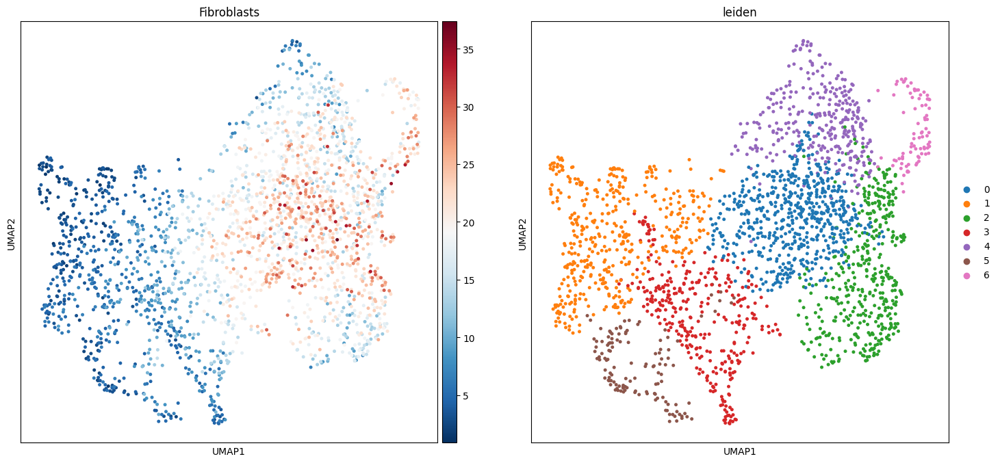

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


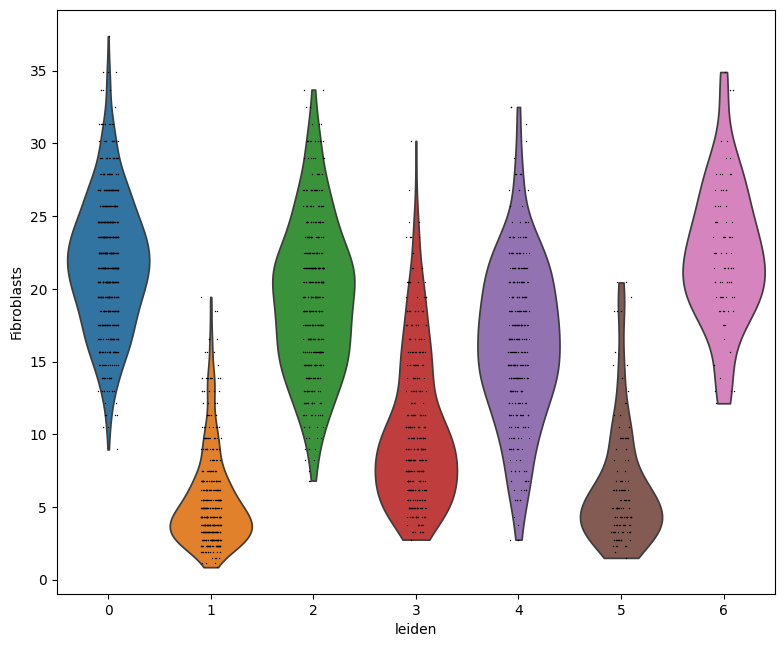

In [ ]:
sc.pl.umap(acts, color=['Fibroblasts', 'leiden'], cmap='RdBu_r')
sc.pl.violin(acts, keys=['Fibroblasts'], groupby='leiden')

In [ ]:
# Annotation

df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Fibroblasts,25.208591,9.014468,3.552751e-109,5.222543e-107
1,0,rest,Pancreatic stellate cells,21.964306,3.734860,4.610375e-88,3.388626e-86
2,0,rest,Hepatic stellate cells,18.988140,3.541342,1.773330e-68,8.689316e-67
3,0,rest,Tanycytes,15.949577,0.613102,4.185389e-52,1.538131e-50
4,0,rest,Myofibroblasts,15.677723,1.640234,1.434940e-50,4.218723e-49
...,...,...,...,...,...,...,...
1024,6,rest,Ductal cells,-9.287530,-2.544502,7.720115e-15,3.782856e-13
1025,6,rest,Cholangiocytes,-9.594819,-2.215967,2.971984e-15,2.184408e-13
1026,6,rest,Anterior pituitary gland cells,NaN,0.000000,1.000000e+00,1.000000e+00
1027,6,rest,Purkinje neurons,NaN,0.000000,1.000000e+00,1.000000e+00


In [ ]:
n_ctypes = 3
ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0': ['Fibroblasts', 'Pancreatic stellate cells', 'Hepatic stellate cells'],
 '1': ['Epithelial cells', 'Luminal epithelial cells', 'Hepatoblasts'],
 '2': ['Kupffer cells', 'Microglia', 'Dendritic cells'],
 '3': ['Ductal cells', 'Cholangiocytes', 'Neutrophils'],
 '4': ['T cells', 'B cells naive', 'NK cells'],
 '5': ['Cholangiocytes', 'Luminal epithelial cells', 'Ductal cells'],
 '6': ['Adipocytes', 'Kupffer cells', 'Fibroblasts']}

In [ ]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Fibroblasts',
 '1': 'Epithelial cells',
 '2': 'Kupffer cells',
 '3': 'Ductal cells',
 '4': 'T cells',
 '5': 'Cholangiocytes',
 '6': 'Adipocytes'}

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


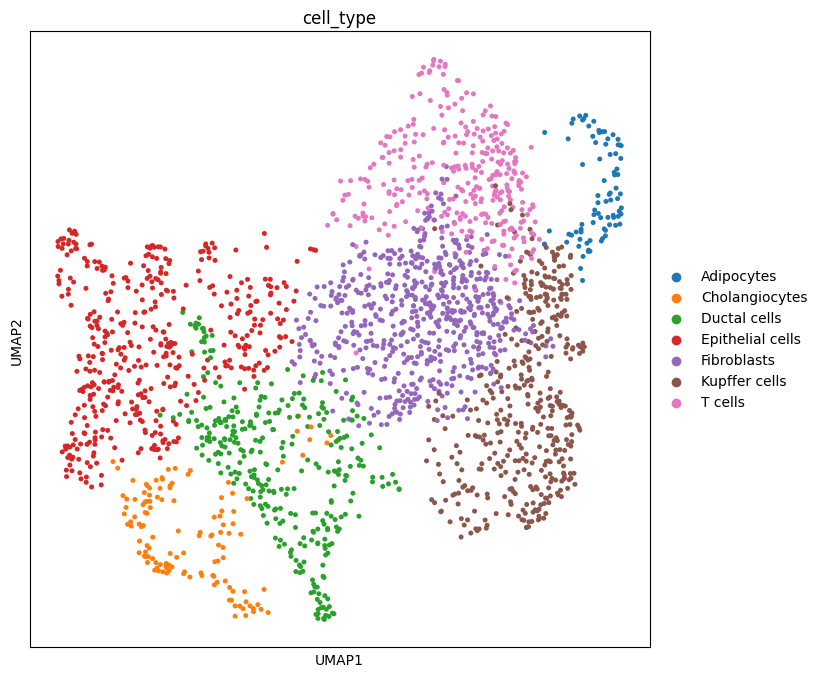

In [ ]:
# Add cell type column based on annotation
adata.obs['cell_type'] = [annotation_dict[clust] for clust in adata.obs['leiden']]

# Visualize
sc.pl.umap(adata, color='cell_type')

# Step 6: Finding Markers of Metastasis/Cancer

In [ ]:
tumor_genes = ['CXCL12', 'S100A4', 'TGFB1', 'MMP2', 'VIM', 'TYROBP', 'PECAM1', 'PDGFRB', 'POSTN', 'SFRP4', 'PTPRC', 'COL6A2', 'COL1A2', 'SPARC']
non_tumor_genes = ['ENAH', 'LAMA5',  'MCF2L',  'ARHGEF35', 'ARHGEF38', 'FARP1', 'VAV3', 'ICAM1', 'VEGFA', 'NDRG1', 'S100A9', 'ERBB2', 'EPCAM', 'MUC1', 'KRT7']

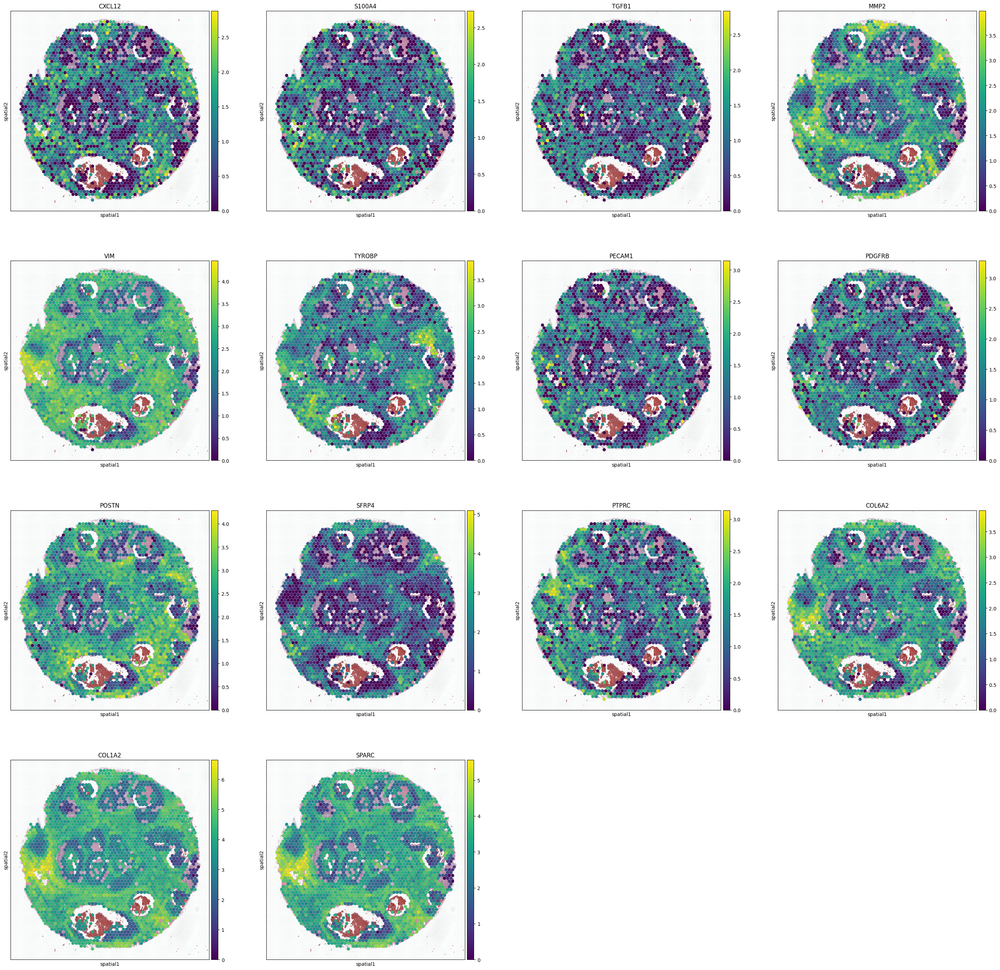

In [ ]:
sc.pl.spatial(adata, img_key="hires", color=tumor_genes, size=1.5)

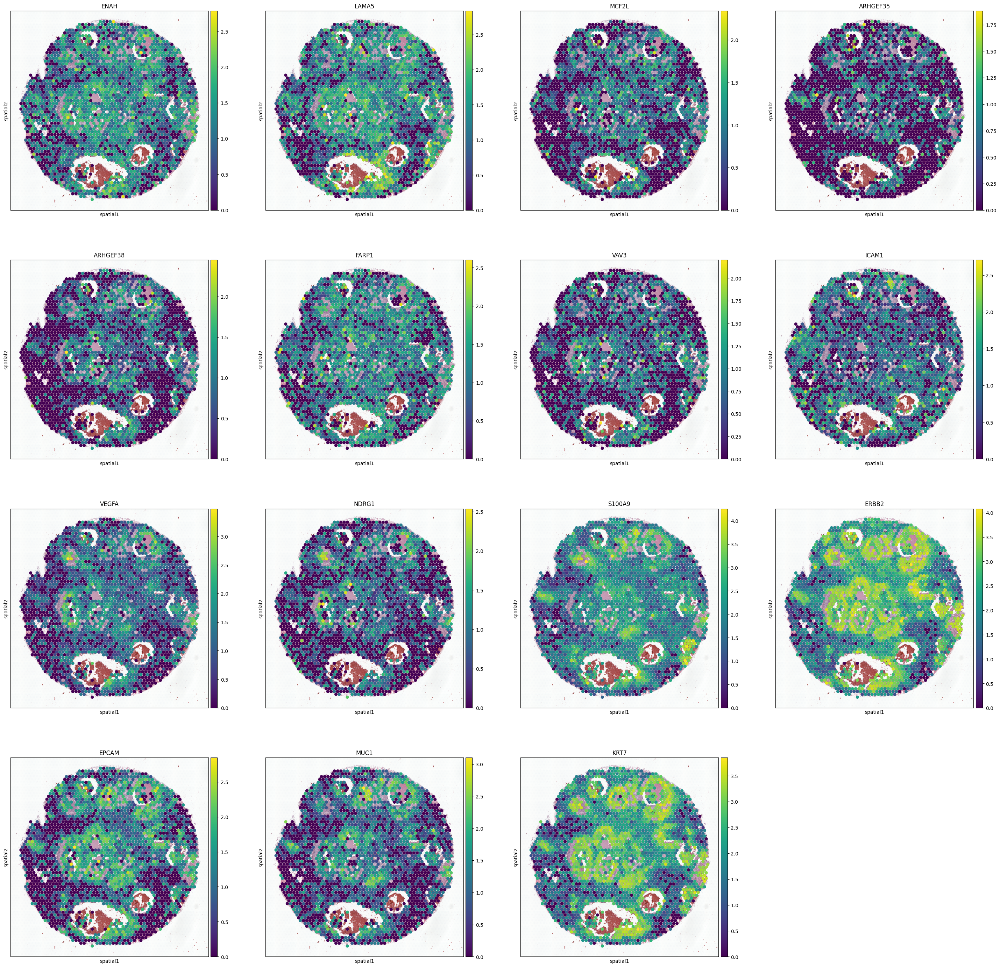

In [ ]:
sc.pl.spatial(adata, img_key="hires", color=non_tumor_genes, size=1.5)